In [1]:
import os
import pandas as pd
import numpy as np
import json
import folium

### Import Data
    

In [2]:
path = 'topojson/'

df_europe = pd.DataFrame.from_csv(path + 'tepsr_wc170(ok).tsv', sep="\t")
#df_europe = pd.DataFrame.from_csv(path + 'hrst_st_nuneage.tsv', sep="\t")
df_europe.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
"unit,sex,age,isced11,geo\time",,,,,,,,,,,,
"PC,T,Y15-24,TOTAL,AT",11.0 b,9.8,9.4 b,8.5,10.7,9.5,8.9,9.4,9.7,10.3,10.6,11.2
"PC,T,Y15-24,TOTAL,BE",21.5 b,20.5,18.8,18.0,21.9,22.4,18.7 b,19.8,23.7,23.2,22.1,20.1
"PC,T,Y15-24,TOTAL,BG",22.3 b,19.5,15.1,12.7 b,16.2,21.9 b,25.0 b,28.1,28.4,23.8,21.6,17.2
"PC,T,Y15-24,TOTAL,CH",8.8 b,7.7,7.1,7.0,8.5,8.2 b,7.7,8.3,8.7,8.6,8.8,8.6
"PC,T,Y15-24,TOTAL,CY",13.9 b,10.0,10.2,9.0,13.8 b,16.6,22.4,27.7,38.9,36.0,32.8,29.1


### Clean Data

Some function to clean the data

In [3]:
#This function word_list match the words
def test_word(words, word_list):
    for idx in range(len(word_list)):
        if(word_list[idx] != words[idx]):
            return False
    
    return True

# This function return the new indices from a word list given (to keep only a part of the DF)
def new_idx(index, word_list, split_on):
    new_index = []
    for idx, val in enumerate(index):
        words = val.split(split_on)
        
        if(test_word(words, word_list)):
            new_index.append(val)
    
    return new_index

# method to keep the clean values because in DF the values are sometimes in str sometimes in float. 
# Futhermore, the str values are like "21.1 b" so we need to keep only the numerical value and delet the other part
def keep_only_values(value):
    new_value = value.copy()
    for i in range(len(value)):
        if(type(value[i]) == str):
            words = value[i].split(" ")
            new_value[i] = words[0]
    return new_value

In [4]:
#Here we just clean the DF some columns were like "2016 " and we didn't wanted the space and the we clean the values
df_europe_clean = df_europe.copy()
df_europe_clean.columns = [x.strip().replace(' ', '') for x in df_europe_clean.columns]
df_europe_clean = df_europe_clean.apply(keep_only_values).apply(pd.to_numeric, errors = 'coerce').fillna(value=0)

In [5]:
df_europe_clean.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
"unit,sex,age,isced11,geo\time",,,,,,,,,,,,
"PC,T,Y15-24,TOTAL,AT",11.0,9.8,9.4,8.5,10.7,9.5,8.9,9.4,9.7,10.3,10.6,11.2
"PC,T,Y15-24,TOTAL,BE",21.5,20.5,18.8,18.0,21.9,22.4,18.7,19.8,23.7,23.2,22.1,20.1
"PC,T,Y15-24,TOTAL,BG",22.3,19.5,15.1,12.7,16.2,21.9,25.0,28.1,28.4,23.8,21.6,17.2
"PC,T,Y15-24,TOTAL,CH",8.8,7.7,7.1,7.0,8.5,8.2,7.7,8.3,8.7,8.6,8.8,8.6
"PC,T,Y15-24,TOTAL,CY",13.9,10.0,10.2,9.0,13.8,16.6,22.4,27.7,38.9,36.0,32.8,29.1


In [6]:
# Here we select a part of the data to see the values
new_df_europe = df_europe_clean.copy()
#word_list = ['RT_UNE','HRSTU','Y15-74']
word_list = ['PC','T','Y15-74','TOTAL']
new_index = new_idx(new_df_europe.index.values, word_list, ',')

new_df_europe = new_df_europe.loc[new_index]
new_df_europe.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
"unit,sex,age,isced11,geo\time",,,,,,,,,,,,
"PC,T,Y15-74,TOTAL,AT",5.6,5.3,4.9,4.1,5.3,4.8,4.6,4.9,5.4,5.6,5.7,6.0
"PC,T,Y15-74,TOTAL,BE",8.5,8.3,7.5,7.0,7.9,8.3,7.2,7.6,8.4,8.5,8.5,7.8
"PC,T,Y15-74,TOTAL,BG",10.1,9.0,6.9,5.6,6.8,10.3,11.3,12.3,13.0,11.4,9.2,7.6
"PC,T,Y15-74,TOTAL,CH",4.5,4.0,3.7,3.4,4.1,4.8,4.4,4.5,4.8,4.9,4.8,5.0
"PC,T,Y15-74,TOTAL,CY",5.3,4.6,3.9,3.7,5.4,6.3,7.9,11.9,15.9,16.1,15.0,13.0


exctraction of some columns

In [7]:
# Function to rename the index (keep only the country code)
def rename_index(df):
    new_df = df.copy()
    
    indexes = new_df.index.values
    
    for words in indexes:
        words_list = words.split(',')
        new_df = new_df.rename(index={words: words_list[len(words_list)-1]})
    
    new_df.index.names = ['Country']
    return new_df

In [8]:
# We clean the indexes
new_df_clean_europe = rename_index(new_df_europe)
#list(new_df_clean)
new_df_clean_europe.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Country,,,,,,,,,,,,
AT,5.6,5.3,4.9,4.1,5.3,4.8,4.6,4.9,5.4,5.6,5.7,6.0
BE,8.5,8.3,7.5,7.0,7.9,8.3,7.2,7.6,8.4,8.5,8.5,7.8
BG,10.1,9.0,6.9,5.6,6.8,10.3,11.3,12.3,13.0,11.4,9.2,7.6
CH,4.5,4.0,3.7,3.4,4.1,4.8,4.4,4.5,4.8,4.9,4.8,5.0
CY,5.3,4.6,3.9,3.7,5.4,6.3,7.9,11.9,15.9,16.1,15.0,13.0


Take only the 2016 to try

In [9]:
#We take just the part of 2016
new_df_europe_2016 = new_df_clean_europe['2016']
new_df_europe_2016.head()

Country
AT     6.0
BE     7.8
BG     7.6
CH     5.0
CY    13.0
Name: 2016, dtype: float64

Now we will import the map and then apply the the data of the year 2016 to see how it works

In [10]:
state_geo_path = r'topojson/europe.geojson'
geo_json_data = json.load(open(state_geo_path))

In [11]:
m_europe = folium.Map([55,20], tiles='cartodbpositron', zoom_start=4)
folium.GeoJson(geo_json_data).add_to(m_europe)
m_europe

In [12]:
# This are the country-code that we have on our data
new_df_europe_2016.index.values

array(['AT', 'BE', 'BG', 'CH', 'CY', 'CZ', 'DE', 'DK', 'EA18', 'EA19',
       'EE', 'EL', 'ES', 'EU27', 'EU28', 'FI', 'FR', 'HR', 'HU', 'IE',
       'IS', 'IT', 'LT', 'LU', 'LV', 'MK', 'MT', 'NL', 'NO', 'PL', 'PT',
       'RO', 'SE', 'SI', 'SK', 'TR', 'UK'], dtype=object)

We can see that we don't have all the countries. However in the database we didn't find good ratio for the missing countries so we keeped only the countries that we already have

We can see that the name of the country are one time in French and in English. So we need to merge them better
So for this we will import an other data and compare the code and the name of the countries. The file cannot be read with panda so we need to import it with csv and keep it on a list

In [13]:
# We have our "translator" in a DF
list_country = pd.read_excel(path + 'countries_code.xlsx', index_col=None, header=0)
list_country.columns = ["Code","English_Name", "Frensh_Name"]
list_country_Engl_Name = list_country.set_index("English_Name")
list_country_Engl_Name.head()

,Code,Frensh_Name
English_Name,,
Andorra,AD,Andorre
United Arab Emirates,AE,Émirats arabes unis
Afghanistan,AF,Afghanistan
Antigua and Barbuda,AG,Antigua-et-Barbuda
Anguilla,AI,Anguilla


We can see that the country code is at the third position and the name at the fifth position

In [14]:
list_country_Engl_Name.index.values
list_country_Engl_Name.loc["Andorra"].Code

'AD'

In [15]:
#This function find the country code form a country name (find the match with the list_country)
def find_country_code(country_name):
    index_country = list_country_Engl_Name.index.values
    for country in index_country:
        if(country == country_name):
            return list_country_Engl_Name.loc[country_name].Code
    
    return country_name

In [16]:
# A function to define the color based on country_name 
def europe_unemployement_colors(country_name):
    country_key = find_country_code(country_name)
    key = new_df_europe_2016.index.values
    # here we use the code so no problem 
    if country_key in key:
        #print(country_key) # now 32
        unemployement = new_df_europe_2016[country_key]
        if unemployement > 9:
            return '#ff0000' # red
        else:
            return '#0000ff' # blue
    else:
        #print(country_name)
        '#000000'

In [17]:
europe_map_colored = folium.Map([55,20], tiles='cartodbpositron', zoom_start=3)
folium.GeoJson(
    geo_json_data,
    style_function=lambda feature: {
        'fillColor': europe_unemployement_colors(feature['properties']['NAME']),
        'color' : 'black',
        'weight' : 2,
        'dashArray' : '5, 5',
        }
    ).add_to(europe_map_colored)

europe_map_colored

Now that we have the map we can save it in a html file


In [18]:
def save_map(df_map,folder, name_file):
    saving_path = "maps/" + folder + "/"
    finale_name_file = name_file + ".html"
    df_map.save(saving_path + finale_name_file)

In [19]:
save_map(europe_map_colored,"01_map_colored", "europe_map_colored")

Now that we now how everything work, we can create the choropleth Map. For that, we need to improve the dataframe so instead of having the name as index, we will put the name of the country and it will be more easier for matching 

In [20]:
# We will see with the country code if it works better
def find_country_code(country_name):
    index_country = list_country.index.values
    for country in index_country:
        if(country == country_name):
            return list_country.loc[country_name].Code
    
    return country_name

# To change the index from country code to country key
def create_country_name(df):
    new_df = df.copy()
    index_df = new_df.index.values 
    
    list_code = list_country.set_index('Code')
    index_list_code = list_code.index.values
    
    for country_code in index_df:
        for list_country_code in index_list_code:
            if (country_code == list_country_code):
                new_df = new_df.rename(index={country_code: list_code.loc[country_code].English_Name})
                
    return new_df

In [21]:
new_df2_clean_europe = create_country_name(new_df_clean_europe)

new_df2_europe_2016 = new_df2_clean_europe['2016']
new_df2_europe_2016.head()

Country
Austria         6.0
Belgium         7.8
Bulgaria        7.6
Switzerland     5.0
Cyprus         13.0
Name: 2016, dtype: float64

Here we can see the choropleth map based on the country_code

In [22]:
#a function to plot a choropleth map
def create_choropleth(loc, key, dataframe,color):
    new_map = folium.Map(location=[55, 20],tiles='cartodbpositron', zoom_start=3)
    new_map.choropleth(geo_data=geo_json_data, data=dataframe,
             #columns=['State', 'Percentage'],
             key_on=key,
             fill_color=color, fill_opacity=0.7, line_opacity=0.2,
             legend_name='Percentage of Unemployement (%)')
    return new_map

First we will see the colorplet based on country code (feature.properties.FIPS)

In [23]:
europe_map = create_choropleth([55, 20], 'feature.properties.FIPS', new_df_europe_2016, 'BuPu')
europe_map

In [24]:
save_map(europe_map,"02_map_BuPu","europe_map_BuPu")

Here we can see the choropleth map based on the country_name (feature.properties.NAME) which is really better

In [25]:
europe_map2 = create_choropleth([55, 20], 'feature.properties.NAME', new_df2_europe_2016, 'YlOrRd')
europe_map2

In [26]:
save_map(europe_map2,"03_map_YlOrRd","europe_map_YlOrRd")

It can be interesting to interact with the data to see the evolution during years

In [27]:
import matplotlib.pyplot as plt

# a function to create a little widget based on the date so one can play with. 
def interaction(date):
    new_df_europe_year_x = new_df2_clean_europe[date]
    europe_map_inter = create_choropleth([55, 20], 'feature.properties.NAME', new_df_europe_year_x, 'YlOrRd')
    # we already save them everytime to have them on html if you want to save one again uncomment the next line
    #save_map(europe_map_inter,"04_map_year", "europe_map_YlOrRd_" + str(date))
    return europe_map_inter

In [28]:
from ipywidgets import interact
dates = new_df_clean_europe.columns.values
interact(interaction, date = list(dates));

The countries in Yellow are the countries where we don't have value for the selected year

Now we can look at all other intervals of age for example from 20 years old to 64 years old or an other one. Do do this we will create all the datafram from our data and interract with them

In [29]:
# a function that create datafram based on a word_list 
def create_df_interact(word_list):
    
    new_df_f_europe = df_europe_clean.copy()
    new_index = new_idx(new_df_f_europe.index.values, word_list, ',')
    new_df_f_europe = new_df_f_europe.loc[new_index]
    new_df_f_europe = rename_index(new_df_f_europe)
    return create_country_name(new_df_f_europe)

In [30]:
europe_Y15_24 = create_df_interact(['PC','T','Y15-24','TOTAL'])
europe_Y15_74 = create_df_interact(['PC','T','Y15-74','TOTAL'])
europe_Y20_64 = create_df_interact(['PC','T','Y20-64','TOTAL'])
europe_Y25_29 = create_df_interact(['PC','T','Y25-29','TOTAL'])
europe_Y25_54 = create_df_interact(['PC','T','Y25-54','TOTAL'])
europe_Y55_64 = create_df_interact(['PC','T','Y55-64','TOTAL'])
europe_Y55_64.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Country,,,,,,,,,,,,
Austria,4.0,4.0,3.4,2.2,2.7,2.5,3.6,3.4,3.8,3.8,4.7,5.0
Belgium,4.4,4.8,4.2,4.4,5.1,4.6,4.0,4.5,5.4,5.4,5.6,5.7
Bulgaria,8.6,7.9,6.8,5.5,6.3,9.0,8.8,10.4,12.4,11.7,8.7,7.3
Switzerland,3.7,3.1,3.1,2.6,2.7,3.5,3.5,3.4,3.3,3.3,4.0,3.8
Cyprus,3.5,3.3,3.1,3.2,4.3,4.7,4.9,9.7,12.4,16.3,15.6,11.5


In [31]:
# to find the correct dataframe to use
def find_correct_data(date, data):
    if(data == 'Y15_24'):
        return europe_Y15_24[date]
    elif(data == 'Y15_74'):
        return europe_Y15_74[date]
    elif(data == 'Y20_64'):
        return europe_Y20_64[date]
    elif(data == 'Y25_29'):
        return europe_Y25_29[date]
    elif(data == 'Y25_54'):
        return europe_Y25_54[date]
    else:
        return europe_Y55_64[date]

In [32]:
def interaction_with_age(date, data):
    new_df_europe_year_x = find_correct_data(date, data)
    europe_map_inter = create_choropleth([55, 20], 'feature.properties.NAME', new_df_europe_year_x, 'YlOrRd')
    # we already save them everytime to have them on html if you want to save one again uncomment the next line (like before)
    #save_map(europe_map_inter,"05_map_year_and_age", "europe_map_YlOrRd_" + str(date) + "_" + str(data))
    return europe_map_inter

In [33]:
dates = new_df_clean_europe.columns.values
list_data = ['Y15_24', 'Y15_74','Y20_64', 'Y25_29','Y25_54', 'Y55_64']
interact(interaction_with_age, date = list(dates), data=list_data);

We add an other representation with bar chart the evolution of each country per years with the correct values

In [34]:
import seaborn
# to plot a datafram with many colors
def plot_df(df, title):
    seaborn.set_palette("Set1")
    #seaborn.set_palette("muted")
    seaborn.set_context("notebook")
    figure, axes = plt.subplots(1, 1, figsize=(16,8))
    result = seaborn.barplot(df.index, df, ax=axes)
    result.set_xticklabels(df.index, rotation=90)
    result.set_title(title, fontsize=14, fontweight="bold")
    
    return result

def interaction_date_bar(date, data):
    %matplotlib inline
    new_df_europe_year_x = find_correct_data(date, data)
    return plot_df(new_df_europe_year_x, data)

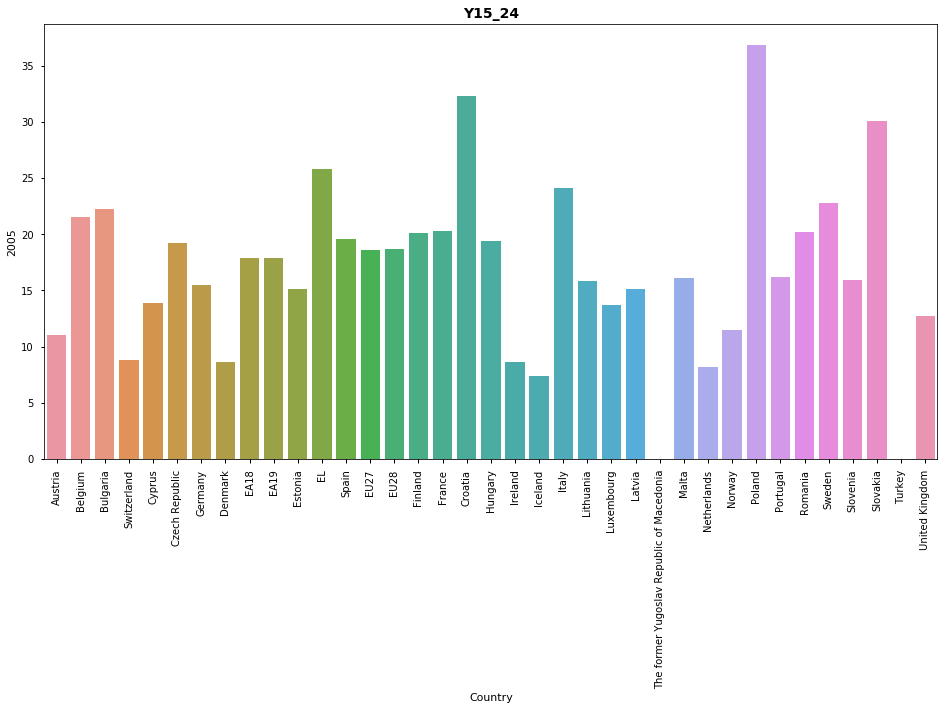

In [35]:
dates = new_df_clean_europe.columns.values
list_data = ['Y15_24', 'Y15_74','Y20_64', 'Y25_29','Y25_54', 'Y55_64']
interact(interaction_date_bar, date = list(dates), data=list_data);

Now we will do by country to see the evolution per year

In [36]:
# a little bit like before but here we base the result on column so need to loc
def find_correct_country(country, data):
    if(data == 'Y15_24'):
        return europe_Y15_24.loc[[country]]
    elif(data == 'Y15_74'):
        return europe_Y15_74.loc[[country]]
    elif(data == 'Y20_64'):
        return europe_Y20_64.loc[[country]]
    elif(data == 'Y25_29'):
        return europe_Y25_29.loc[[country]]
    elif(data == 'Y25_54'):
        return europe_Y25_54.loc[[country]]
    else:
        return europe_Y55_64.loc[[country]]

In [37]:
import matplotlib as mpl
def interaction_country_bar(country, data):
    %matplotlib inline
    new_df_europe_country_x = find_correct_country(country, data)
    new_df_europe_country_x = new_df_europe_country_x.transpose()
    mpl.style.use('default')
    return new_df_europe_country_x.plot(kind = 'bar', title =country, figsize=(20,10));

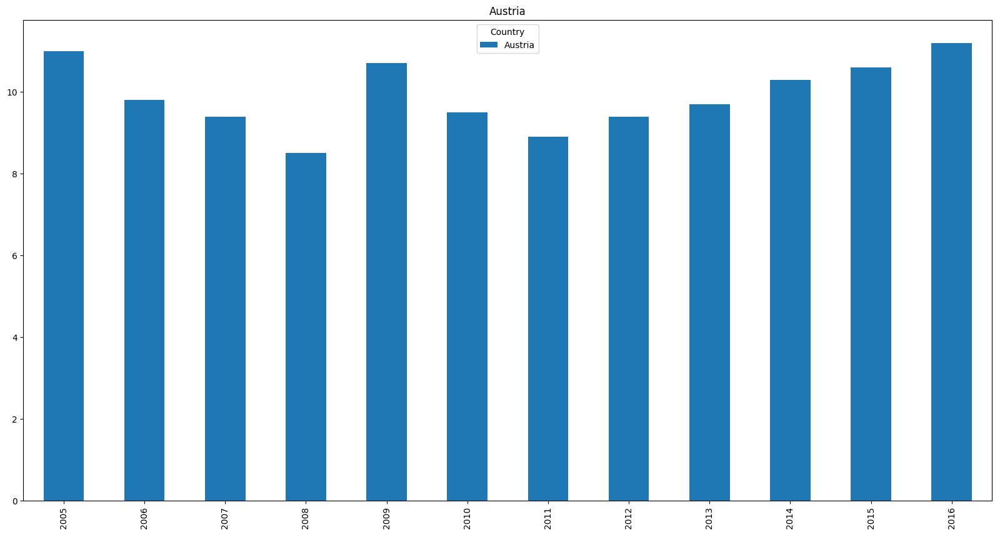

In [38]:
countries = europe_Y15_24.index.values
list_data = ['Y15_24', 'Y15_74','Y20_64', 'Y25_29','Y25_54', 'Y55_64']
interact(interaction_country_bar, country = list(countries), data=list_data);

Compare Switzerland's unemployment rate to that of the rest of Europe: The Swiss unemployment is always very low  compared to a large part of the others countries.We can see that today there are not many countries that have such a small ratio like Switzerland. We think that there are many reasons behind it. For example, in Switzerland, unemployment benefits are of shorter duration time so one needs to find quickly a job. There is no minimum salary and  the country's economy is more liberal and better than in other so-called rich countries. Theses reasons (there are others reasons too) can explain why we have a low ratio of unemployment and this a good adventage compared to the others countries.

We choose these colors for the map because we think that it represent the best the unemployment. When a country has a big ratio of unemployment it should be in red because that means that many people don't have a job and the country be worry about this. This is why we choose these colors because unemployment is a important thing and in red it catches our eye on the countries with big ratio. 

We also choose the bar chart interaction reprensentation so one can play with the boxes to see the differencies between the country each year. It's easier to understand in this format because in the map we don't see always the differencies with some colors. So it's harder to really understand the exact value but with a bar chart it's easier and that's why we add this plot. A question might be why we don't keep the same colors? The reason is simple because here we want to see the différent values between the countries, so it's better to represent them with other colors so we don't misunderstand the values between the countries. 

Finally for the last bar chart, we did it in a normal way with simple color because it shows better the evolution of the unemployment by country. We don't need multiple colors for this representation because it's all in one country and to be consistant with what we did before we keep one color (you can see above that the countries are represented by each time a different color).

## 2. Switzerland unemployment numbers ##

Going to https://www.amstat.ch/v2/index.jsp?lang=fr and then clicking on details, we were able to get the umemployment data for switzerland in a xlsx format

In [120]:
unemployment_switzerland = pd.read_excel(path + '2_1 Taux de chômageA.xlsx', index_col=None, header=0)
cantons_code = pd.read_excel(path + 'cantons_codes.xlsx', index_col=None, header=0)

In [121]:
unemployment_switzerland.head()

,Canton,Janvier 2006,Février 2006,Mars 2006,Avril 2006,Mai 2006,Juin 2006,Juillet 2006,Août 2006,Septembre 2006,...,Mai 2016,Juin 2016,Juillet 2016,Août 2016,Septembre 2016,Octobre 2016,Novembre 2016,Décembre 2016,Janvier 2017,Total
0,NaN,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,...,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage,Taux de chômage
1,Zurich,4,3.9,3.7,3.5,3.3,3.2,3.1,3.1,3.1,...,3.6,3.5,3.5,3.5,3.6,3.6,3.7,3.8,3.9,3.2
2,Berne,3,2.9,2.8,2.6,2.4,2.2,2.2,2.2,2.3,...,2.6,2.5,2.5,2.6,2.6,2.6,2.8,3,3,2.3
3,Lucerne,3.2,3.2,3,2.8,2.6,2.5,2.5,2.5,2.5,...,2,1.9,1.9,2,1.9,1.9,2,2.2,2.2,2.1
4,Uri,1.3,1.2,1.3,1.2,1,0.8,0.7,0.9,1.1,...,1,0.7,0.7,0.9,0.9,1,1.1,1.3,1.5,1.1


we don't need all those column in fact we only need the even ones

In [122]:
df_ch = unemployment_switzerland.loc[1:, :]
df_ch.head()

,Canton,Janvier 2006,Février 2006,Mars 2006,Avril 2006,Mai 2006,Juin 2006,Juillet 2006,Août 2006,Septembre 2006,...,Mai 2016,Juin 2016,Juillet 2016,Août 2016,Septembre 2016,Octobre 2016,Novembre 2016,Décembre 2016,Janvier 2017,Total
1,Zurich,4,3.9,3.7,3.5,3.3,3.2,3.1,3.1,3.1,...,3.6,3.5,3.5,3.5,3.6,3.6,3.7,3.8,3.9,3.2
2,Berne,3,2.9,2.8,2.6,2.4,2.2,2.2,2.2,2.3,...,2.6,2.5,2.5,2.6,2.6,2.6,2.8,3,3,2.3
3,Lucerne,3.2,3.2,3,2.8,2.6,2.5,2.5,2.5,2.5,...,2,1.9,1.9,2,1.9,1.9,2,2.2,2.2,2.1
4,Uri,1.3,1.2,1.3,1.2,1,0.8,0.7,0.9,1.1,...,1,0.7,0.7,0.9,0.9,1,1.1,1.3,1.5,1.1
5,Schwyz,2.4,2.4,2.2,2,1.9,1.7,1.8,1.9,1.8,...,1.7,1.6,1.6,1.6,1.6,1.7,1.8,1.9,2,1.6


In [123]:
df_ch = df_ch.set_index("Canton")
df_ch = df_ch.apply(pd.to_numeric, errors='coerce', axis=1)

In [124]:
df_ch

,Janvier 2006,Février 2006,Mars 2006,Avril 2006,Mai 2006,Juin 2006,Juillet 2006,Août 2006,Septembre 2006,Octobre 2006,...,Mai 2016,Juin 2016,Juillet 2016,Août 2016,Septembre 2016,Octobre 2016,Novembre 2016,Décembre 2016,Janvier 2017,Total
Canton,,,,,,,,,,,,,,,,,,,,,
Zurich,4.0,3.9,3.7,3.5,3.3,3.2,3.1,3.1,3.1,3.0,...,3.6,3.5,3.5,3.5,3.6,3.6,3.7,3.8,3.9,3.2
Berne,3.0,2.9,2.8,2.6,2.4,2.2,2.2,2.2,2.3,2.4,...,2.6,2.5,2.5,2.6,2.6,2.6,2.8,3.0,3.0,2.3
Lucerne,3.2,3.2,3.0,2.8,2.6,2.5,2.5,2.5,2.5,2.5,...,2.0,1.9,1.9,2.0,1.9,1.9,2.0,2.2,2.2,2.1
Uri,1.3,1.2,1.3,1.2,1.0,0.8,0.7,0.9,1.1,1.2,...,1.0,0.7,0.7,0.9,0.9,1.0,1.1,1.3,1.5,1.1
Schwyz,2.4,2.4,2.2,2.0,1.9,1.7,1.8,1.9,1.8,1.9,...,1.7,1.6,1.6,1.6,1.6,1.7,1.8,1.9,2.0,1.6
Obwald,1.9,1.8,1.7,1.6,1.5,1.3,1.3,1.3,1.3,1.3,...,1.0,0.9,1.0,0.9,0.8,1.0,0.9,1.0,1.0,1.1
Nidwald,2.2,2.0,1.8,1.7,1.6,1.4,1.5,1.5,1.5,1.5,...,1.1,1.1,1.2,1.2,1.1,1.1,1.1,1.3,1.3,1.2
Glaris,2.8,2.7,2.7,2.5,2.3,2.2,2.1,2.1,2.0,2.0,...,2.2,2.2,2.3,2.3,2.3,2.2,2.4,2.5,2.5,2.1
Zoug,3.1,3.0,2.7,2.6,2.4,2.3,2.4,2.4,2.4,2.3,...,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.5,2.6,2.2


In [125]:
df_ch = df_ch.drop(['Total'])

In [126]:
df_ch.head()

,Janvier 2006,Février 2006,Mars 2006,Avril 2006,Mai 2006,Juin 2006,Juillet 2006,Août 2006,Septembre 2006,Octobre 2006,...,Mai 2016,Juin 2016,Juillet 2016,Août 2016,Septembre 2016,Octobre 2016,Novembre 2016,Décembre 2016,Janvier 2017,Total
Canton,,,,,,,,,,,,,,,,,,,,,
Zurich,4.0,3.9,3.7,3.5,3.3,3.2,3.1,3.1,3.1,3.0,...,3.6,3.5,3.5,3.5,3.6,3.6,3.7,3.8,3.9,3.2
Berne,3.0,2.9,2.8,2.6,2.4,2.2,2.2,2.2,2.3,2.4,...,2.6,2.5,2.5,2.6,2.6,2.6,2.8,3.0,3.0,2.3
Lucerne,3.2,3.2,3.0,2.8,2.6,2.5,2.5,2.5,2.5,2.5,...,2.0,1.9,1.9,2.0,1.9,1.9,2.0,2.2,2.2,2.1
Uri,1.3,1.2,1.3,1.2,1.0,0.8,0.7,0.9,1.1,1.2,...,1.0,0.7,0.7,0.9,0.9,1.0,1.1,1.3,1.5,1.1
Schwyz,2.4,2.4,2.2,2.0,1.9,1.7,1.8,1.9,1.8,1.9,...,1.7,1.6,1.6,1.6,1.6,1.7,1.8,1.9,2.0,1.6


In [127]:
cantons_code

,Code,Canton
0,ZH,Zurich
1,BE,Berne
2,LU,Lucerne
3,UR,Uri
4,SZ,Schwyz
5,OW,Obwald
6,NW,Nidwald
7,GL,Glaris
8,ZG,Zoug
9,FR,Fribourg


In [128]:
df_ch = df_ch.reset_index()
df_ch = df_ch.merge(cantons_code,on="Canton")

In [131]:
df_ch.head()

,Canton,Janvier 2006,Février 2006,Mars 2006,Avril 2006,Mai 2006,Juin 2006,Juillet 2006,Août 2006,Septembre 2006,...,Juin 2016,Juillet 2016,Août 2016,Septembre 2016,Octobre 2016,Novembre 2016,Décembre 2016,Janvier 2017,Total,Code
0,Zurich,4.0,3.9,3.7,3.5,3.3,3.2,3.1,3.1,3.1,...,3.5,3.5,3.5,3.6,3.6,3.7,3.8,3.9,3.2,ZH
1,Berne,3.0,2.9,2.8,2.6,2.4,2.2,2.2,2.2,2.3,...,2.5,2.5,2.6,2.6,2.6,2.8,3.0,3.0,2.3,BE
2,Lucerne,3.2,3.2,3.0,2.8,2.6,2.5,2.5,2.5,2.5,...,1.9,1.9,2.0,1.9,1.9,2.0,2.2,2.2,2.1,LU
3,Uri,1.3,1.2,1.3,1.2,1.0,0.8,0.7,0.9,1.1,...,0.7,0.7,0.9,0.9,1.0,1.1,1.3,1.5,1.1,UR
4,Schwyz,2.4,2.4,2.2,2.0,1.9,1.7,1.8,1.9,1.8,...,1.6,1.6,1.6,1.6,1.7,1.8,1.9,2.0,1.6,SZ


In [132]:
state_geo_path2 = r'topojson/ch-cantons.topojson.json'
geo_json_data2 = open(state_geo_path2)
ch_map = folium.Map([46.9167, 7.4667], zoom_start=7)
ch_map.choropleth(geo_data=geo_json_data2,topojson='objects.cantons', data=df_ch,
             columns=['Code', 'Janvier 2017'],
             key_on='id',
             fill_color='BuPu', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Percentage of unemployed (%)')
ch_map